## Figures 1 and 9

We experiment with several state-of-the-art neural synthesizers based on transposed convolutions (**MelGAN** and **Demucs** autoencoder) or on alternative upsampling layers (**interpolation** and **subpixel convolutions**). 

Transposed convolutions in MelGAN and Demucs introduce what we call “tonal artifacts” (the horizontal "lines" in the spectrograms below) after initialization. 

Next, we modify Demucs’ upsampling layers to rely on nearest neigbor interpolation or subpixel convolution upsamplers. Interpolation upsamplers can introduce what we describe as “filtering artifacts” (the horizontal "valleys" in the spectrograms below), while subpixel convolution can also introduce the above mentioned “tonal artifacts”.

**[!]** We first define the above mentioned models, and then we experiment with those.

In [1]:
# Importing libraries..
import numpy as np

import matplotlib.pyplot as plt
from matplotlib import rcParams
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 80})
plt.rcParams["figure.figsize"] = (18,12)

import librosa
import librosa.display
from librosa.filters import mel as librosa_mel_fn

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.utils import weight_norm

import warnings
warnings.filterwarnings("ignore")

import IPython.display as ipd

# 1: Models' definition

## Demucs

In [2]:
# Demucs code adapted from the repository of the original authors: https://github.com/facebookresearch/demucs

class Demucs(nn.Module):
    def __init__(self, original=True, use_bias=False):
        super(Demucs, self).__init__()

        k = 1
        kernel_conv = 8
        stride_conv = 4
        kernel_glu = 3
        stride_glu = 1
        self.use_bias = use_bias
        self.original = original

        # encoder parameters
        self.conv1 = nn.Conv1d(1, int(k*100), kernel_conv, stride=stride_conv, bias=use_bias)
        self.conv1_glu = nn.Conv1d(int(k*100),int(2*k*100), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.conv2 = nn.Conv1d(int(k*100), int(k*200), kernel_conv, stride=stride_conv, bias=use_bias)
        self.conv2_glu = nn.Conv1d(int(k*200),int(2*k*200), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.conv3 = nn.Conv1d(int(k*200), int(k*400), kernel_conv, stride=stride_conv, bias=use_bias)
        self.conv3_glu = nn.Conv1d(int(k*400),int(2*k*400), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.conv4 = nn.Conv1d(int(k*400), int(k*800), kernel_conv, stride=stride_conv, bias=use_bias)
        self.conv4_glu = nn.Conv1d(int(k*800),int(2*k*800), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.conv5 = nn.Conv1d(int(k*800), int(k*1600), kernel_conv, stride=stride_conv, bias=use_bias)
        self.conv5_glu = nn.Conv1d(int(k*1600),int(2*k*1600), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.conv6 = nn.Conv1d(int(k*1600), int(k*3200), kernel_conv, stride=stride_conv, bias=use_bias)
        self.conv6_glu = nn.Conv1d(int(k*3200),int(2*k*3200), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)

        # bottleneck parameters
        self.rnn = nn.LSTM(int(k*3200), int(k*3200), num_layers=2, bidirectional=True, bias=use_bias)
        self.linear = nn.Linear(int(k*3200)*2, int(k*3200), bias=use_bias)

        # decoder parameters
        self.deconv6_glu = nn.Conv1d(int(k*3200),int(2*k*3200), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.deconv6 = nn.ConvTranspose1d(int(k*3200), int(k*1600), kernel_conv, stride=stride_conv, output_padding=2, bias=use_bias)
        self.deconv5_glu = nn.Conv1d(int(k*1600),int(2*k*1600), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.deconv5 = nn.ConvTranspose1d(int(k*1600), int(k*800), kernel_conv, stride=stride_conv, output_padding=2, bias=use_bias)
        self.deconv4_glu = nn.Conv1d(int(k*800),int(2*k*800), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.deconv4 = nn.ConvTranspose1d(int(k*800), int(k*400), kernel_conv, stride=stride_conv, output_padding=2, bias=use_bias)
        self.deconv3_glu = nn.Conv1d(int(k*400),int(2*k*400), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.deconv3 = nn.ConvTranspose1d(int(k*400), int(k*200), kernel_conv, stride=stride_conv, output_padding=2, bias=use_bias)
        self.deconv2_glu = nn.Conv1d(int(k*200),int(2*k*200), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.deconv2 = nn.ConvTranspose1d(int(k*200),int(k*100), kernel_conv, stride=stride_conv, output_padding=3, bias=use_bias)
        self.deconv1_glu = nn.Conv1d(int(k*100),int(2*k*100), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.deconv1 = nn.ConvTranspose1d(int(k*100), 1, kernel_conv, stride=stride_conv, output_padding=0, bias=use_bias)

    def forward(self, x):
        
        # encoder
        if self.original:
            e1 = F.glu(self.conv1_glu(F.relu_(self.conv1(x))), 1)
        else: # modification: remove relu in first layer to minimize signal offsets
            e1 = F.glu(self.conv1_glu(self.conv1(x)), 1) 
        e2 = F.glu(self.conv2_glu(F.relu_(self.conv2(e1))), 1)
        e3 = F.glu(self.conv3_glu(F.relu_(self.conv3(e2))), 1)
        e4 = F.glu(self.conv4_glu(F.relu_(self.conv4(e3))), 1)
        e5 = F.glu(self.conv5_glu(F.relu_(self.conv5(e4))), 1)
        e6 = F.glu(self.conv6_glu(F.relu_(self.conv6(e5))), 1)

        # bottleneck
        out = e6.permute(2, 0, 1)
        self.rnn.flatten_parameters()
        out = self.rnn(out)[0]
        out = self.linear(out)
        out = out.permute(1, 2, 0)

        # decoder
        out = F.relu_(self.deconv6(F.glu(self.deconv6_glu(out+e6), 1)))
        out = F.relu_(self.deconv5(F.glu(self.deconv5_glu(out+e5), 1)))
        out = F.relu_(self.deconv4(F.glu(self.deconv4_glu(out+e4), 1)))
        out = F.relu_(self.deconv3(F.glu(self.deconv3_glu(out+e3), 1)))
        out = F.relu_(self.deconv2(F.glu(self.deconv2_glu(out+e2), 1)))
        return self.deconv1(F.glu(self.deconv1_glu(out+e1), 1))


## Interpolation

In [3]:
# Demucs modification using nn.Upsample() layers from pytorch (instead of transposed convolutions).

class Interpolation(nn.Module):
    def __init__(self, upsampler, original=True, use_bias=False):
        super(Interpolation, self).__init__()

        k = 1
        kernel_conv = 9
        stride_conv = downsample = 4
        kernel_glu = 3
        stride_glu = 1
        self.upsampler = upsampler
        self.use_bias = use_bias
        self.original = original

        # encoder parameters
        self.conv1 = nn.Conv1d(1, int(k*100), kernel_conv, stride=downsample, padding=kernel_conv//2, bias=use_bias)
        self.conv1_glu = nn.Conv1d(int(k*100),int(2*k*100), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.conv2 = nn.Conv1d(int(k*100), int(k*200), kernel_conv, stride=downsample, padding=kernel_conv//2, bias=use_bias)
        self.conv2_glu = nn.Conv1d(int(k*200),int(2*k*200), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.conv3 = nn.Conv1d(int(k*200), int(k*400), kernel_conv, stride=downsample, padding=kernel_conv//2, bias=use_bias)
        self.conv3_glu = nn.Conv1d(int(k*400),int(2*k*400), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.conv4 = nn.Conv1d(int(k*400), int(k*800), kernel_conv, stride=downsample, padding=kernel_conv//2, bias=use_bias)
        self.conv4_glu = nn.Conv1d(int(k*800),int(2*k*800), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.conv5 = nn.Conv1d(int(k*800), int(k*1600), kernel_conv, stride=downsample, padding=kernel_conv//2, bias=use_bias)
        self.conv5_glu = nn.Conv1d(int(k*1600),int(2*k*1600), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.conv6 = nn.Conv1d(int(k*1600), int(k*3200), kernel_conv, stride=downsample, padding=kernel_conv//2, bias=use_bias)
        self.conv6_glu = nn.Conv1d(int(k*3200),int(2*k*3200), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)

        # bottleneck parameters
        self.rnn = nn.LSTM(int(k*3200), int(k*3200), num_layers=2, bidirectional=True, bias=use_bias)
        self.linear = nn.Linear(int(k*3200)*2, int(k*3200), bias=use_bias)

        # decoder parameters
        self.deconv6_glu = nn.Conv1d(int(k*3200),int(2*k*3200), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.deconv6 = nn.Conv1d(int(k*3200), int(k*1600), kernel_conv, stride=1, padding=kernel_conv//2, bias=use_bias)
        self.deconv5_glu = nn.Conv1d(int(k*1600),int(2*k*1600), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.deconv5 = nn.Conv1d(int(k*1600), int(k*800), kernel_conv, stride=1, padding=kernel_conv//2, bias=use_bias)
        self.deconv4_glu = nn.Conv1d(int(k*800),int(2*k*800), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.deconv4 = nn.Conv1d(int(k*800), int(k*400), kernel_conv, stride=1, padding=kernel_conv//2, bias=use_bias)
        self.deconv3_glu = nn.Conv1d(int(k*400),int(2*k*400), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.deconv3 = nn.Conv1d(int(k*400), int(k*200), kernel_conv, stride=1, padding=kernel_conv//2, bias=use_bias)
        self.deconv2_glu = nn.Conv1d(int(k*200),int(2*k*200), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.deconv2 = nn.Conv1d(int(k*200),int(k*100), kernel_conv, stride=1, padding=kernel_conv//2, bias=use_bias)
        self.deconv1_glu = nn.Conv1d(int(k*100),int(2*k*100), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.deconv1 = nn.Conv1d(int(k*100), 1, kernel_conv, stride=1, padding=kernel_conv//2, bias=use_bias)

        if self.upsampler == 'nearest':
            self.up = nn.Upsample(scale_factor=downsample, mode='nearest')
        elif self.upsampler == 'linear':
            self.up = nn.Upsample(scale_factor=downsample, mode='linear', align_corners=True)

    def forward(self, x):
        # encoder
        if self.original:
            e1 = F.glu(self.conv1_glu(F.relu_(self.conv1(x))), 1)
        else: # modification: remove relu in first layer to minimize signal offsets
            e1 = F.glu(self.conv1_glu(self.conv1(x)), 1)            
        e2 = F.glu(self.conv2_glu(F.relu_(self.conv2(e1))), 1)
        e3 = F.glu(self.conv3_glu(F.relu_(self.conv3(e2))), 1)
        e4 = F.glu(self.conv4_glu(F.relu_(self.conv4(e3))), 1)
        e5 = F.glu(self.conv5_glu(F.relu_(self.conv5(e4))), 1)
        e6 = F.glu(self.conv6_glu(F.relu_(self.conv6(e5))), 1)

        # bottleneck
        out = e6.permute(2, 0, 1)
        self.rnn.flatten_parameters()
        out = self.rnn(out)[0]
        out = self.linear(out)
        out = out.permute(1, 2, 0)

        # decoder
        out = F.relu_(self.deconv6(self.up(F.glu(self.deconv6_glu(out+e6), 1))))
        out = F.relu_(self.deconv5(self.up(F.glu(self.deconv5_glu(out+e5), 1))))
        out = F.relu_(self.deconv4(self.up(F.glu(self.deconv4_glu(out+e4), 1))))
        out = F.relu_(self.deconv3(self.up(F.glu(self.deconv3_glu(out+e3), 1))))
        out = F.relu_(self.deconv2(self.up(F.glu(self.deconv2_glu(out+e2), 1))))
        return self.deconv1(self.up(F.glu(self.deconv1_glu(out+e1), 1)))

## Subpixel Convolution

In [4]:
# Demucs modification using a 1D adaptation of the pixelshuffle layers (instead of transposed convolutions).

def shuffle(x, upscale_factor):
    batch_size, channels, steps = x.size()
    channels //= upscale_factor
    input_view = x.contiguous().view(batch_size, channels, upscale_factor, steps)
    shuffle_out = input_view.permute(0, 1, 3, 2).contiguous()
    return shuffle_out.view(batch_size, channels, steps * upscale_factor)


class SubpixelConvolution(nn.Module):
    def __init__(self, original=True, use_bias=False):
        super(SubpixelConvolution, self).__init__()

        k = 0.9
        kernel_conv = 9
        self.stride_conv = stride_conv = downsample = 4
        kernel_glu = 3
        stride_glu = 1
        self.use_bias = use_bias
        self.original = original

        # encoder parameters
        self.conv1 = nn.Conv1d(1, int(k*100), kernel_conv, stride=stride_conv, padding=kernel_conv//2, bias=use_bias)
        self.conv1_glu = nn.Conv1d(int(k*100),int(2*k*100), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.conv2 = nn.Conv1d(int(k*100), int(k*200), kernel_conv, stride=stride_conv, padding=kernel_conv//2, bias=use_bias)
        self.conv2_glu = nn.Conv1d(int(k*200),int(2*k*200), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.conv3 = nn.Conv1d(int(k*200), int(k*400), kernel_conv, stride=stride_conv, padding=kernel_conv//2, bias=use_bias)
        self.conv3_glu = nn.Conv1d(int(k*400),int(2*k*400), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.conv4 = nn.Conv1d(int(k*400), int(k*800), kernel_conv, stride=stride_conv, padding=kernel_conv//2, bias=use_bias)
        self.conv4_glu = nn.Conv1d(int(k*800),int(2*k*800), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.conv5 = nn.Conv1d(int(k*800), int(k*1600), kernel_conv, stride=stride_conv, padding=kernel_conv//2, bias=use_bias)
        self.conv5_glu = nn.Conv1d(int(k*1600),int(2*k*1600), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.conv6 = nn.Conv1d(int(k*1600), int(k*3200), kernel_conv, stride=stride_conv, padding=kernel_conv//2, bias=use_bias)
        self.conv6_glu = nn.Conv1d(int(k*3200),int(2*k*3200), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)

        # bottleneck parameters
        self.rnn = nn.LSTM(int(k*3200), int(k*3200), num_layers=2, bidirectional=True, bias=use_bias)
        self.linear = nn.Linear(int(k*3200)*2, int(k*3200), bias=use_bias)

        # decoder parameters
        self.deconv6_glu = nn.Conv1d(int(k*3200),int(2*k*3200), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.deconv6 = nn.Conv1d(int(k*3200), int(k*1600)*stride_conv, kernel_conv, stride=1, padding=kernel_conv//2, bias=use_bias)
        self.deconv5_glu = nn.Conv1d(int(k*1600),int(2*k*1600), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.deconv5 = nn.Conv1d(int(k*1600), int(k*800)*stride_conv, kernel_conv, stride=1, padding=kernel_conv//2, bias=use_bias)
        self.deconv4_glu = nn.Conv1d(int(k*800),int(2*k*800), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.deconv4 = nn.Conv1d(int(k*800), int(k*400)*stride_conv, kernel_conv, stride=1, padding=kernel_conv//2, bias=use_bias)
        self.deconv3_glu = nn.Conv1d(int(k*400),int(2*k*400), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.deconv3 = nn.Conv1d(int(k*400), int(k*200)*stride_conv, kernel_conv, stride=1, padding=kernel_conv//2, bias=use_bias)
        self.deconv2_glu = nn.Conv1d(int(k*200),int(2*k*200), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.deconv2 = nn.Conv1d(int(k*200), int(k*100)*stride_conv, kernel_conv, stride=1, padding=kernel_conv//2, bias=use_bias)
        self.deconv1_glu = nn.Conv1d(int(k*100),int(2*k*100), kernel_glu, stride=stride_glu, padding=kernel_glu//2, bias=use_bias)
        self.deconv1 = nn.Conv1d(int(k*100), 1*stride_conv, kernel_conv, stride=1, padding=kernel_conv//2, bias=use_bias)


    def forward(self, x):
        # encoder
        if self.original:
            e1 = F.glu(self.conv1_glu(F.relu_(self.conv1(x))), 1)
        else: # modification: remove relu in first layer to minimize signal offsets
            e1 = F.glu(self.conv1_glu(self.conv1(x)), 1)            
        e2 = F.glu(self.conv2_glu(F.relu_(self.conv2(e1))), 1)
        e3 = F.glu(self.conv3_glu(F.relu_(self.conv3(e2))), 1)
        e4 = F.glu(self.conv4_glu(F.relu_(self.conv4(e3))), 1)
        e5 = F.glu(self.conv5_glu(F.relu_(self.conv5(e4))), 1)
        e6 = F.glu(self.conv6_glu(F.relu_(self.conv6(e5))), 1)

        # bottleneck
        out = e6.permute(2, 0, 1)
        self.rnn.flatten_parameters()
        out = self.rnn(out)[0]
        out = self.linear(out)
        out = out.permute(1, 2, 0)

        # decoder
        out = shuffle(F.relu_(self.deconv6(F.glu(self.deconv6_glu(out+e6), 1))), self.stride_conv)
        out = shuffle(F.relu_(self.deconv5(F.glu(self.deconv5_glu(out+e5), 1))), self.stride_conv)
        out = shuffle(F.relu_(self.deconv4(F.glu(self.deconv4_glu(out+e4), 1))), self.stride_conv)
        out = shuffle(F.relu_(self.deconv3(F.glu(self.deconv3_glu(out+e3), 1))), self.stride_conv)
        out = shuffle(F.relu_(self.deconv2(F.glu(self.deconv2_glu(out+e2), 1))), self.stride_conv)
        return shuffle(self.deconv1(F.glu(self.deconv1_glu(out+e1), 1)), self.stride_conv)

## MelGAN

In [5]:
# MelGAN code adapted from the repository of the original authors: https://github.com/descriptinc/melgan-neurips

def weights_init(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find("BatchNorm2d") != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

def WNConv1d(*args, **kwargs):
    return weight_norm(nn.Conv1d(*args, **kwargs))

def WNConvTranspose1d(*args, **kwargs):
    return weight_norm(nn.ConvTranspose1d(*args, **kwargs))

class Audio2Mel(nn.Module):
    def __init__(
        self,
        n_fft=1024,
        hop_length=256,
        win_length=1024,
        sampling_rate=22050,
        n_mel_channels=80,
        mel_fmin=0.0,
        mel_fmax=None,
    ):
        super().__init__()
        window = torch.hann_window(win_length).float()
        mel_basis = librosa_mel_fn(
            sampling_rate, n_fft, n_mel_channels, mel_fmin, mel_fmax
        )
        mel_basis = torch.from_numpy(mel_basis).float()
        self.register_buffer("mel_basis", mel_basis)
        self.register_buffer("window", window)
        self.n_fft = n_fft
        self.hop_length = hop_length
        self.win_length = win_length
        self.sampling_rate = sampling_rate
        self.n_mel_channels = n_mel_channels

    def forward(self, audio):
        p = (self.n_fft - self.hop_length) // 2
        audio = F.pad(audio, (p, p), "reflect").squeeze(1)
        fft = torch.stft(
            audio,
            n_fft=self.n_fft,
            hop_length=self.hop_length,
            win_length=self.win_length,
            window=self.window,
            center=False,
        )
        real_part, imag_part = fft.unbind(-1)
        magnitude = torch.sqrt(real_part ** 2 + imag_part ** 2)
        mel_output = torch.matmul(self.mel_basis, magnitude)
        log_mel_spec = torch.log10(torch.clamp(mel_output, min=1e-5))
        return log_mel_spec


class ResnetBlock(nn.Module):
    def __init__(self, dim, dilation=1):
        super().__init__()
        self.block = nn.Sequential(
            nn.LeakyReLU(0.2),
            nn.ReflectionPad1d(dilation),
            WNConv1d(dim, dim, kernel_size=3, dilation=dilation),
            nn.LeakyReLU(0.2),
            WNConv1d(dim, dim, kernel_size=1),
        )
        self.shortcut = WNConv1d(dim, dim, kernel_size=1)

    def forward(self, x):
        return self.shortcut(x) + self.block(x)


class Generator(nn.Module):
    def __init__(self, input_size, ngf, n_residual_layers):
        super().__init__()
        ratios = [8, 8, 2, 2]
        self.hop_length = np.prod(ratios)
        mult = int(2 ** len(ratios))

        model = [
            nn.ReflectionPad1d(3),
            WNConv1d(input_size, mult * ngf, kernel_size=7, padding=0),
        ]

        # Upsample to raw audio scale
        for i, r in enumerate(ratios):
            model += [
                nn.LeakyReLU(0.2),
                WNConvTranspose1d(
                    mult * ngf,
                    mult * ngf // 2,
                    kernel_size=r * 2,
                    stride=r,
                    padding=r // 2 + r % 2,
                    output_padding=r % 2,
                ),
            ]

            for j in range(n_residual_layers):
                model += [ResnetBlock(mult * ngf // 2, dilation=3 ** j)]

            mult //= 2

        model += [
            nn.LeakyReLU(0.2),
            nn.ReflectionPad1d(3),
            WNConv1d(ngf, 1, kernel_size=7, padding=0),
            nn.Tanh(),
        ]

        self.model = nn.Sequential(*model)
        self.apply(weights_init)

    def forward(self, x):
        return self.model(x)


# 2: Experiments

Now we experiment with the above defined architectures.

The Demucs-like architectures (non-MelGAN ones) we study operate at a sampling rate of 44100Hz.

Let's create a test signal for Demucs-like models!

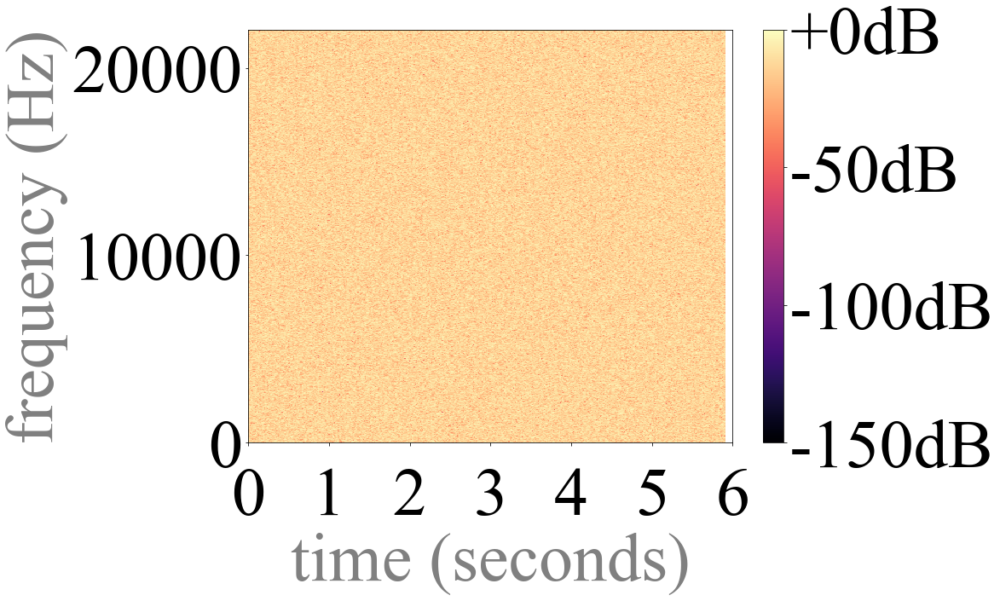

In [6]:
signal = 'random' # 'ones' or 'random'

if signal == 'ones':
    # ones input signal: is an empty spectra that allows nice visualizations
    sr = 44100
    x = torch.ones(262144) # approx 6 seconds of random noise at 441000Hz
elif signal == 'random':
    # random input signal: to use a white noise signal for testing
    sr = 44100
    x = torch.rand(262144)*2-1 # approx 6 seconds of random noise at 441000Hz
    
np_x = x.detach().numpy()
ax = plt.subplot(1,1,1)
ax.tick_params(axis='x', which='major', pad=25)
X = librosa.stft(np_x, center=False) # center=False to avoid measuring boundary artifacts due to STFT
ref=np.max(np.abs(X))
librosa.display.specshow(20*np.log10(np.abs(X)/ref), sr=sr, y_axis='linear', x_axis='time', vmin=-150, vmax=0)
plt.xticks(np.arange(0,7,1))
plt.colorbar(format='%+2.fdB')
plt.xlabel('time (seconds)', color="gray")
plt.ylabel('frequency (Hz)', color="gray")
plt.tight_layout()
plt.savefig('PNGs/signal_Fig1_44kHz.png')

ipd.Audio(x, rate=sr)

In the following, we observe the upsampling artifacts (after initialization) introduced by the original Demucs architecture with **transposed convolutions**.

Note the tonal artifacts (horizontal line) that emerge after initialization.

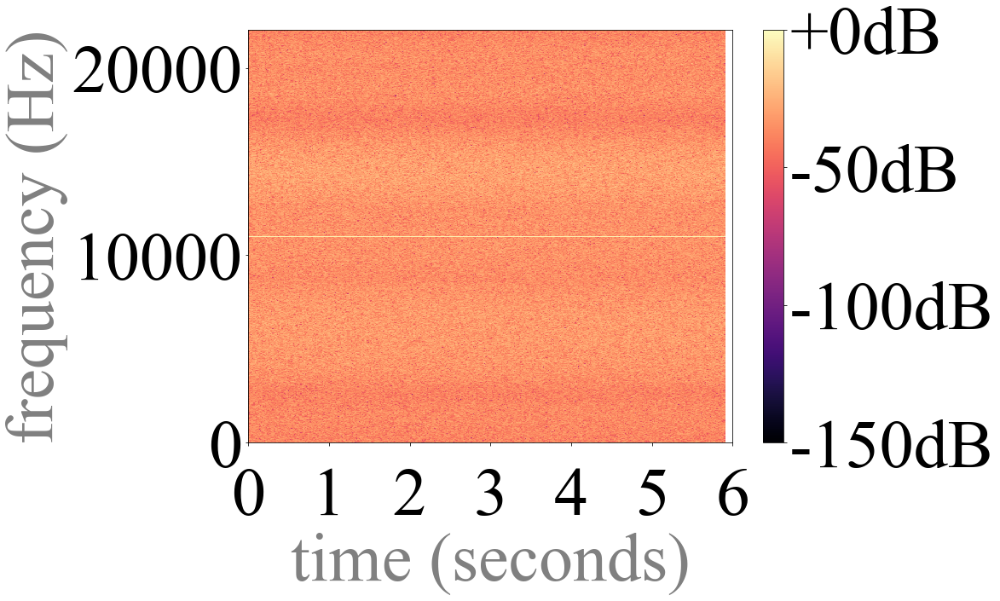

In [7]:
model = Demucs(use_bias=True)
output = model(x.view(1,1,-1))

np_output = np.squeeze(output.detach().numpy())
Y = librosa.stft(np_output, center=False) # center=False to avoid measuring boundary artifacts due to STFT
ax = plt.subplot(1,1,1)
ax.tick_params(axis='x', which='major', pad=25)
librosa.display.specshow(20*np.log10(np.abs(Y)/ref), sr=sr, y_axis='linear', x_axis='time', vmin=-150, vmax=0)
plt.colorbar(format='%+2.fdB')
plt.xticks(np.arange(0,7,1))
plt.xlabel('time (seconds)', color="gray")
plt.ylabel('frequency (Hz)', color="gray")
plt.tight_layout()
plt.savefig('PNGs/demucs.png')

ipd.Audio(np_output, rate=sr)

The upsampling artifacts (after initialization) introduced by the original Demucs architecture are not visible after removing: (i) the biases of the model and (ii) ReLU of the first layer. 

In the implementation above, one can achieve this modification by setting original=False. By doing so, one removes the spectral replicas of signal offsets – a strong source of tonal artifacts.

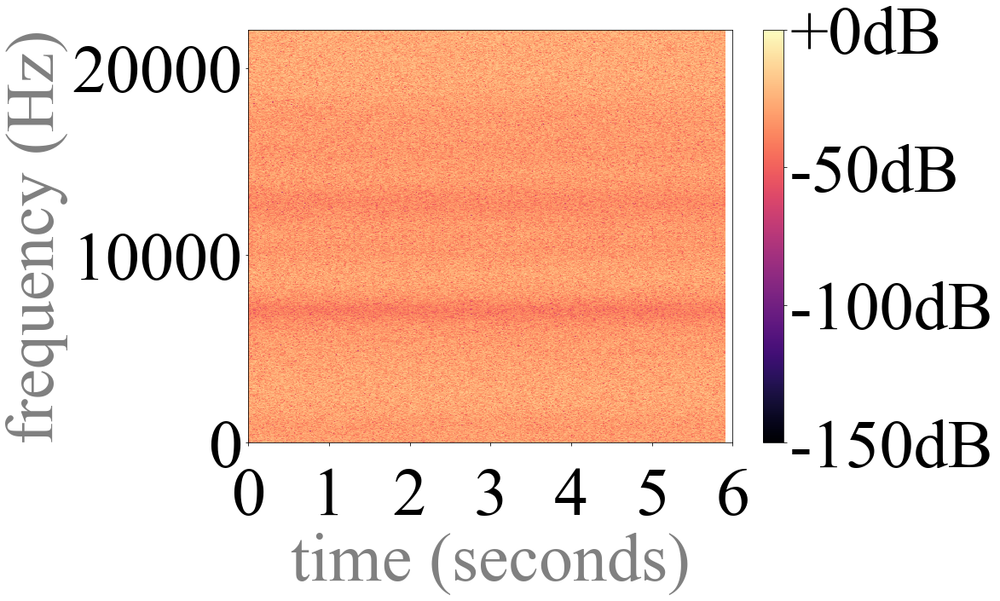

In [8]:
model = Demucs(original=False, use_bias=False)
output = model(x.view(1,1,-1))

np_output = np.squeeze(output.detach().numpy())
Y = librosa.stft(np_output, center=False) # center=False to avoid measuring boundary artifacts due to STFT
ax = plt.subplot(1,1,1)
ax.tick_params(axis='x', which='major', pad=25)
librosa.display.specshow(20*np.log10(np.abs(Y)/ref), sr=sr, y_axis='linear', x_axis='time', vmin=-150, vmax=0)
plt.colorbar(format='%+2.fdB')
plt.xticks(np.arange(0,7,1))
plt.xlabel('time (seconds)', color="gray")
plt.ylabel('frequency (Hz)', color="gray")
plt.tight_layout()
plt.savefig('PNGs/demucs_mod.png')

ipd.Audio(np_output, rate=sr)

Next, we observe the upsampling artifacts (after initialization) introduced by the Demucs architecture when using **linear interpolation** upsampling layers instead of transposed convolutions.
    
Note the filtering artifacts (horizontal valley) that emerge after initialization.

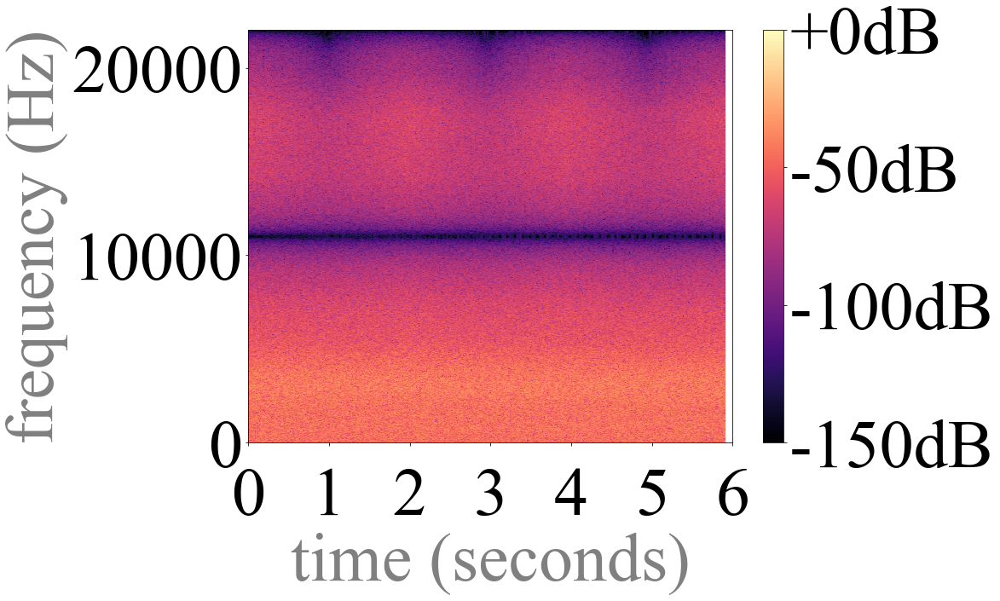

In [9]:
model = Interpolation(upsampler='linear', use_bias=True)
output = model(x.view(1,1,-1))

np_output = np.squeeze(output.detach().numpy())
Y = librosa.stft(np_output, center=False) # center=False to avoid measuring boundary artifacts due to STFT
ax = plt.subplot(1,1,1)
ax.tick_params(axis='x', which='major', pad=25)
librosa.display.specshow(20*np.log10(np.abs(Y)/ref), sr=sr, y_axis='linear', x_axis='time', vmin=-150, vmax=0)
plt.colorbar(format='%+2.fdB')
plt.xticks(np.arange(0,7,1))
plt.xlabel('time (seconds)', color="gray")
plt.ylabel('frequency (Hz)', color="gray")
plt.tight_layout()
plt.savefig('PNGs/linear.png')

ipd.Audio(np_output, rate=sr)

The following figure shows the upsampling artifacts (after initialization) introduced by the Demucs architecture when using **nearest neighbor interpolation** upsampling layers instead of transposed convolutions.

Note the filtering artifacts (horizontal valley) that emerge after initialization.

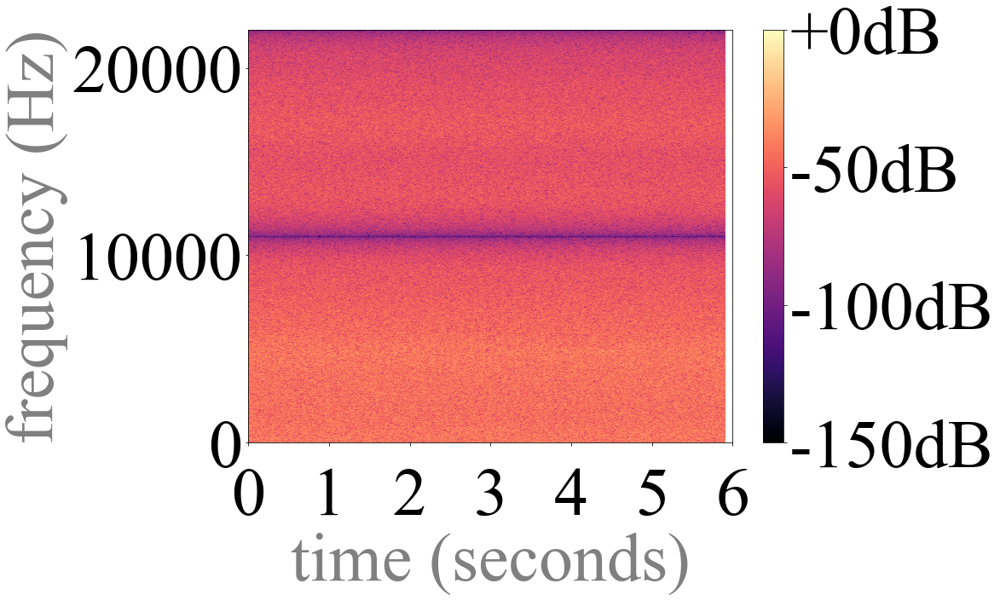

In [10]:
model = Interpolation(upsampler='nearest', use_bias=True)
output = model(x.view(1,1,-1))

np_output = np.squeeze(output.detach().numpy())
Y = librosa.stft(np_output, center=False) # center=False to avoid measuring boundary artifacts due to STFT
ax = plt.subplot(1,1,1)
ax.tick_params(axis='x', which='major', pad=25)
librosa.display.specshow(20*np.log10(np.abs(Y)/ref), sr=sr, y_axis='linear', x_axis='time', vmin=-150, vmax=0)
plt.colorbar(format='%+2.fdB')
plt.xticks(np.arange(0,7,1))
plt.xlabel('time (seconds)', color="gray")
plt.ylabel('frequency (Hz)', color="gray")
plt.tight_layout()
plt.savefig('PNGs/nearest.png')

ipd.Audio(np_output, rate=sr)

Finally, we can observe the upsampling artifacts (after initialization) introduced by the Demucs architecture when using **subpixel convolution** upsampling layers instead of transposed convolutions.
    
Note the tonal artifacts (horizontal line) that emerge after initialization.

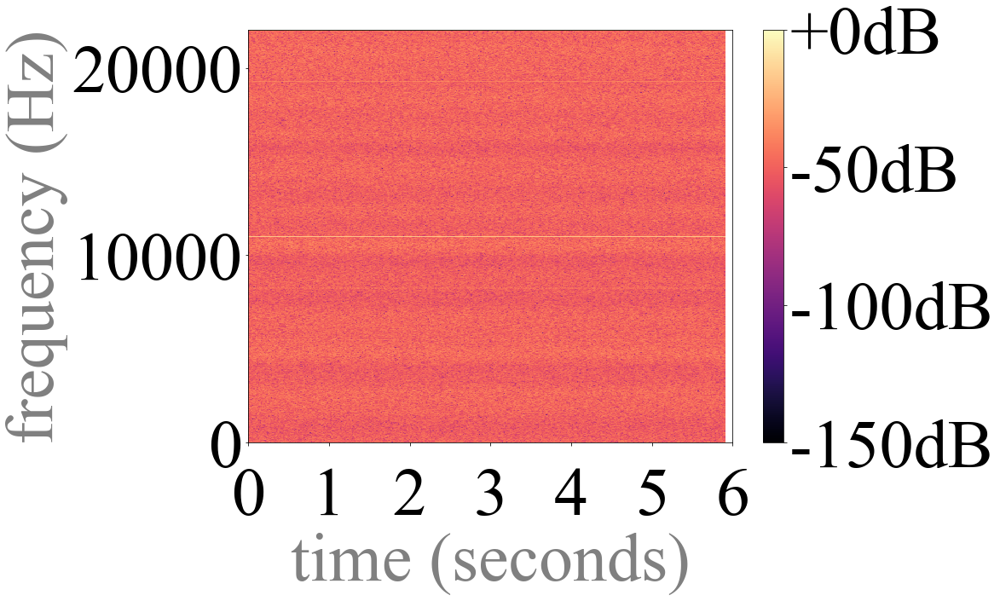

In [11]:
model = SubpixelConvolution(use_bias=True)
output = model(x.view(1,1,-1))

np_output = np.squeeze(output.detach().numpy())
Y = librosa.stft(np_output, center=False) # center=False to avoid measuring boundary artifacts due to STFT
ax = plt.subplot(1,1,1)
ax.tick_params(axis='x', which='major', pad=25)
librosa.display.specshow(20*np.log10(np.abs(Y)/ref), sr=sr, y_axis='linear', x_axis='time', vmin=-150, vmax=0)
plt.colorbar(format='%+2.fdB')
plt.xticks(np.arange(0,7,1))
plt.xlabel('time (seconds)', color="gray")
plt.ylabel('frequency (Hz)', color="gray")
plt.tight_layout()
plt.savefig('PNGs/subpixelcnn.png')

ipd.Audio(np_output, rate=sr)

The upsampling artifacts (after initialization) introduced by the modified Demucs architecture with subpixel convolution are not visible after removing: (i) the biases of the model and (ii) ReLU of the first layer.

In the implementation above, one can achieve this modification by setting original=False. By doing so, one removes the spectral replicas of signal offsets – a strong source of tonal artifacts.

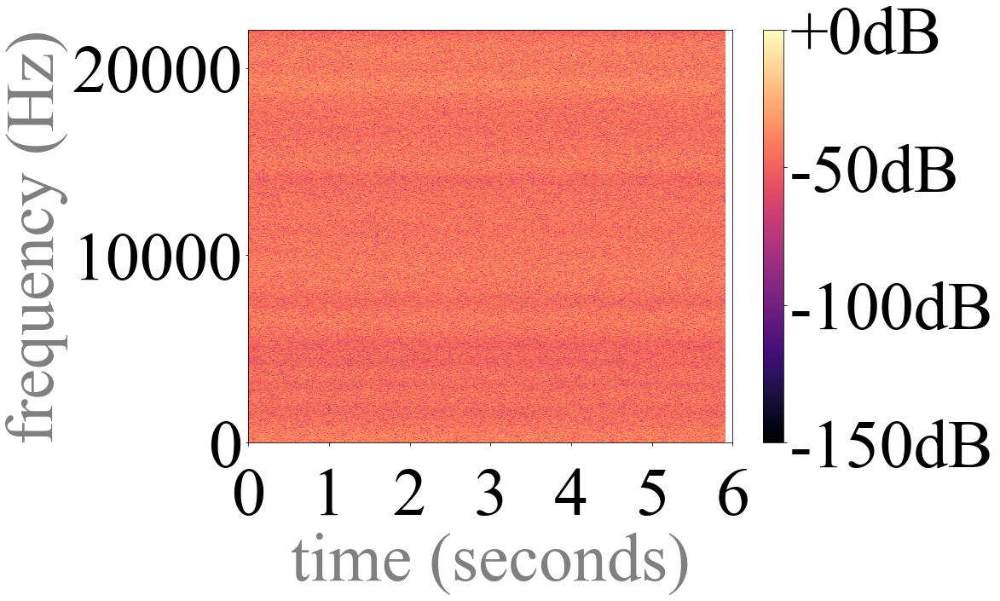

In [12]:
model = SubpixelConvolution(original=False,use_bias=False)
output = model(x.view(1,1,-1))

np_output = np.squeeze(output.detach().numpy())
Y = librosa.stft(np_output, center=False) # center=False to avoid measuring boundary artifacts due to STFT
ax = plt.subplot(1,1,1)
ax.tick_params(axis='x', which='major', pad=25)
librosa.display.specshow(20*np.log10(np.abs(Y)/ref), sr=sr, y_axis='linear', x_axis='time', vmin=-150, vmax=0)
plt.colorbar(format='%+2.fdB')
plt.xticks(np.arange(0,7,1))
plt.xlabel('time (seconds)', color="gray")
plt.ylabel('frequency (Hz)', color="gray")
plt.tight_layout()
plt.savefig('PNGs/subpixelcnn_mod.png')

ipd.Audio(np_output, rate=sr)

The original MelGAN operates at a sampling rate of 22050Hz.

Let's create a test signal for MelGAN!

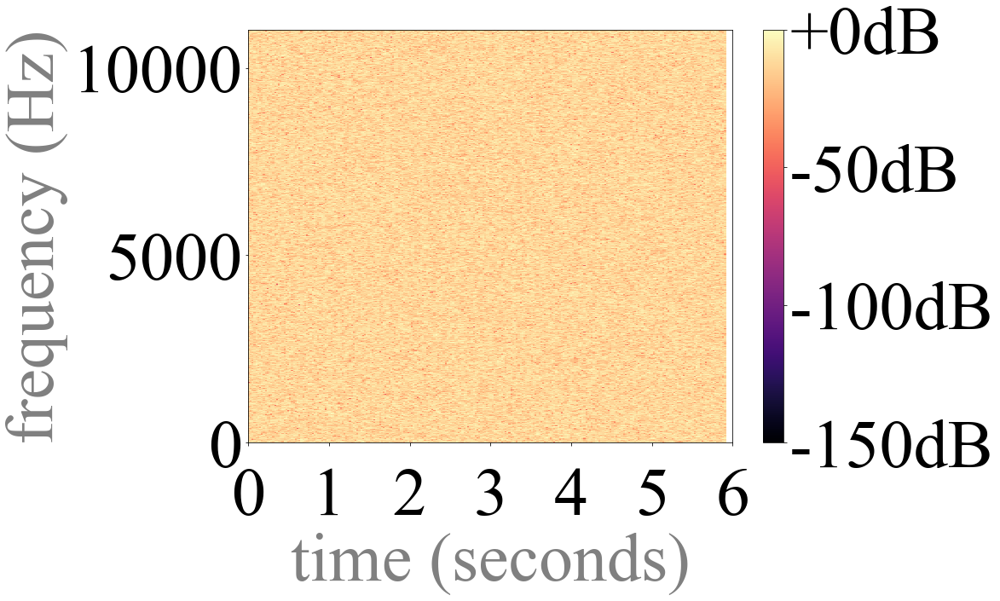

In [13]:
sr = 22050
if signal == 'ones':
    # ones input signal: is an empty spectra that allows nice visualizations
    x = torch.ones(sr*6) # approx 6 seconds of random noise at 441000Hz
elif signal == 'random':
    # random input signal: to use a white noise signal for testing
    x = torch.rand(sr*6)*2-1 # approx 6 seconds of random noise at 441000Hz
    
np_x = x.detach().numpy()
ax = plt.subplot(1,1,1)
ax.tick_params(axis='x', which='major', pad=25)
X = librosa.stft(np_x, center=False) # center=False to avoid measuring boundary artifacts due to STFT
ref=np.max(np.abs(X))
librosa.display.specshow(20*np.log10(np.abs(X)/ref), sr=sr, y_axis='linear', x_axis='time', vmin=-150, vmax=0)
plt.xticks(np.arange(0,7,1))
plt.colorbar(format='%+2.fdB')
plt.xlabel('time (seconds)', color="gray")
plt.ylabel('frequency (Hz)', color="gray")
plt.tight_layout()
plt.savefig('PNGs/signal_Fig1_22kHz.png')

ipd.Audio(x, rate=sr)

In this last figure, we can observe the upsampling artifacts (after initialization) introduced by the original MelGAN architecture, using **transposed convolutions**.

Note the tonal artifacts (horizontal line) that emerge after initialization.

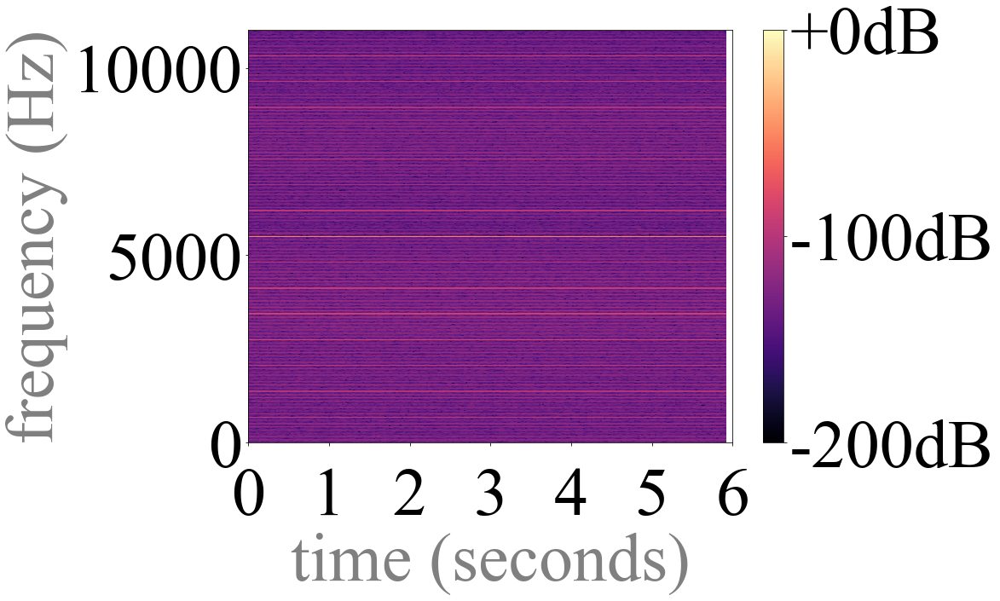

In [14]:
netG = Generator(80, 32, 3) # default MelGAN parameters
fft = Audio2Mel(n_mel_channels=80) # default MelGAN parameters
    
s_t = fft(x.view(1,1,-1))
x_pred_t = netG(s_t)

np_output = np.squeeze(x_pred_t.detach().numpy())
Y = librosa.stft(np_output, center=False) # center=False to avoid measuring boundary artifacts due to STFT
ref=np.max(np.abs(Y))
ax = plt.subplot(1,1,1)
ax.tick_params(axis='x', which='major', pad=25)
librosa.display.specshow(20*np.log10(np.abs(Y)/ref), sr=sr, y_axis='linear', x_axis='time', vmin=-200, vmax=0)
plt.xticks(np.arange(0,7,1))
plt.colorbar(format='%+2.fdB')
plt.xlabel('time (seconds)', color="gray")
plt.ylabel('frequency (Hz)', color="gray")
plt.tight_layout()
plt.savefig('PNGs/melgan.png')

ipd.Audio(np_output, rate=sr)